In [1]:
%load_ext autoreload
%autoreload 2
    
import os 
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import models
import jax.numpy as jnp
import deepxde as dde

from absl import flags
from ml_collections import config_flags, config_dict
from configs.ts import get_config
from bubble_tools.bubble_tools.bubble_ellipsoid_tools import load_ellipse


config = get_config()
CONFIG_NAME = 'configs/ts.py'
ckpt_path = os.path.join(".", "ckpt", CONFIG_NAME)


2024-04-17 12:07:19.976361: W external/xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.4.99). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.
2024-04-17 12:07:21.261820: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 12:07:21.261851: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 12:07:21.262553: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS 

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Chamfer Distance: 3.0


In [2]:
a, b = 0.06, 0.04
L = 15. # Scalling factor 
L_f = 1e3 #e6
a, b = 0.06, 0.04
E, P, t, nu = 5e5, 2757, 0.0003, 0.5


ellipse_points = load_ellipse(2*a, 2*b, num_points=10000)
wall_coords = jnp.array(ellipse_points)
outer = dde.geometry.Ellipse([0,0], a, b)
test_points_subset = outer.uniform_points(5000)

In [3]:
from bubble_tools.bubble_datasets.implemented_datasets.bubble_calibration_board_dataset import BubbleCalibrationBoardDataset
data_dir = '/data'# Replace this with the path to the data
data_name = 'tactile_shadowing_data'
data_path = os.path.join(data_dir, data_name)
dataset = BubbleCalibrationBoardDataset(data_name=data_path, 
                                    smoothed=True, 
                                    load_cache=False, 
                                    load_trajectories=True)


Processing the data and saving it to /data/tactile_shadowing_data/processed_data/bubble_calibration_dataset_trajectories


100%|██████████████████████████████████████████████████████████████████████████████| 30/30 [00:30<00:00,  1.02s/it]

Data processed


In [4]:
TRAJ_IDX = 6 #5
SEQ_IDX = 15 #15
data_i = dataset[TRAJ_IDX]

In [5]:
from mmint_tools.camera_tools.pointcloud_utils import tr_pointcloud
bubble_pc_bcf = data_i['bubble_pc_bcf'][SEQ_IDX][...,:3]
tool_name = data_i['shape_id'][SEQ_IDX]
w_X_bcf = data_i['w_X_bcf'][SEQ_IDX]
w_X_stl = data_i['w_X_sf'][SEQ_IDX]
obs_pcd = data_i['bubble_pc_bcf'][SEQ_IDX][...,:3].reshape(-1,3)
shear_field_nominal_to_deflated = data_i['shear'][SEQ_IDX]
depth_array_meters = data_i['depth'][SEQ_IDX][...,:3]

In [6]:
from bubble_tools.aux.package_utils import get_mesh_path
from bubble_tools.bubble_shape_tools.shape_tools import load_mesh
import numpy as np

mesh_path = get_mesh_path(f'{tool_name}.stl')
tool_mesh = load_mesh(mesh_path)

In [7]:
import os
import open3d as o3d
import mmint_tools.data_utils.loading_utils as load_utils
from bubble_tools.bubble_tools.bubble_shear_tools import load_deformation_field, load_deformation_field_advanced,  compute_deformation_field_advanced
import numpy as np

data_dir_ref = '/home/young/Research/tactileshadow/dataset'  # Replace this with the path to the data
folder_name_ref = 'bubble_calibration_data'
scene_name_ref = 'left_bubble_sphere_d35mm'
fc_ref = 99999 # de

data_path_ref = os.path.join(data_dir_ref, folder_name_ref)
o3d_pcd = o3d.io.read_point_cloud( os.path.join(data_path_ref, 'nominal_all.ply'))



shear_field_nominal_to_deformed = load_utils.load_shear_deformation(data_path=data_path_ref,
                                            scene_name=scene_name_ref,
                                            camera_name='pico_flexx_left',
                                            fc=fc_ref)  # (171, 224, 2)

shear_field_deflated_to_deformed = - shear_field_nominal_to_deflated + shear_field_nominal_to_deformed
camera_info = load_utils.load_camera_info_depth(data_path=data_path_ref,
                                                    scene_name=scene_name_ref,
                                                    camera_name='pico_flexx_left',
                                                    fc=2)

depth_array_meters_ref = load_utils.load_image_depth(data_path=data_path_ref,
                                                         scene_name=scene_name_ref,
                                                         camera_name='pico_flexx_left',
                                                         fc=fc_ref)


deformation_3d = compute_deformation_field_advanced(shear_field_deflated_to_deformed,
                                            depth_array_meters,
                                            depth_array_meters_ref,
                                            camera_info['K'],
                                            extended=True,
                                            smoothed=True,
                                            flat_ref = True,
                                            frame = 'bf') # (120, 135, 3)
deformation_3d = np.float32(deformation_3d)


/tmp/ipykernel_1204140/2432826833.py:34: DeprecationWarning: `round_` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `round` instead.
  deformation_3d = compute_deformation_field_advanced(shear_field_deflated_to_deformed,


In [8]:
from bubble_tools.bubble_tools.bubble_constants import get_bubble_frame_from_camera_frame
# w_X_stl[:3, :3] = np.eye(3)
stl_X_bcf = np.linalg.inv(w_X_stl) @ w_X_bcf
bubble_pc_stl = tr_pointcloud(bubble_pc_bcf, T=stl_X_bcf)  # (H, W, 3 or 6)


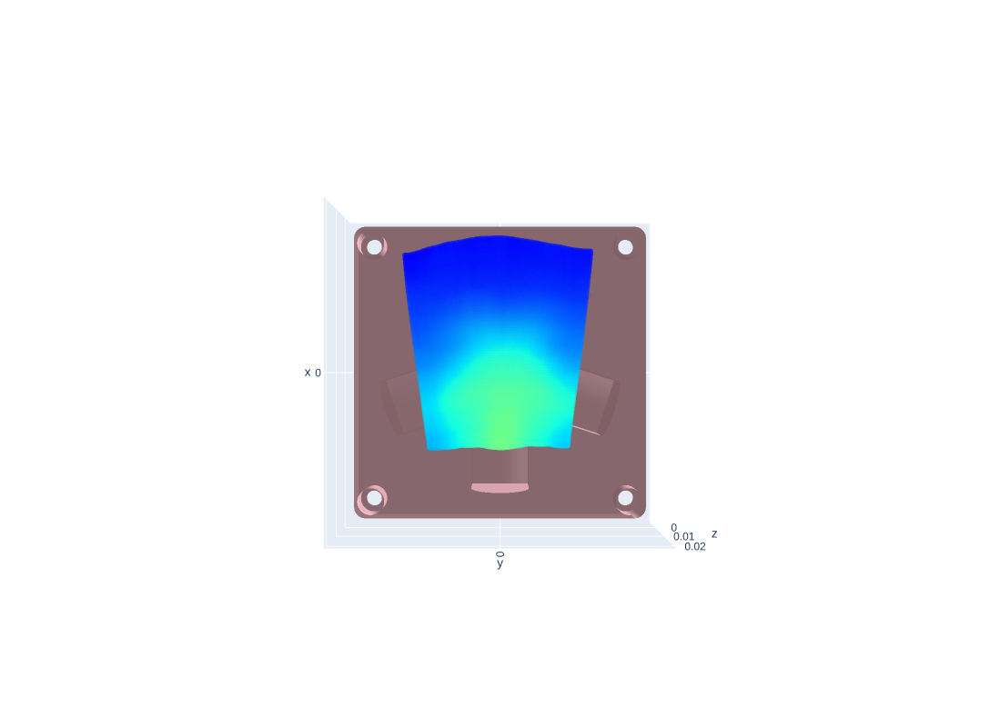

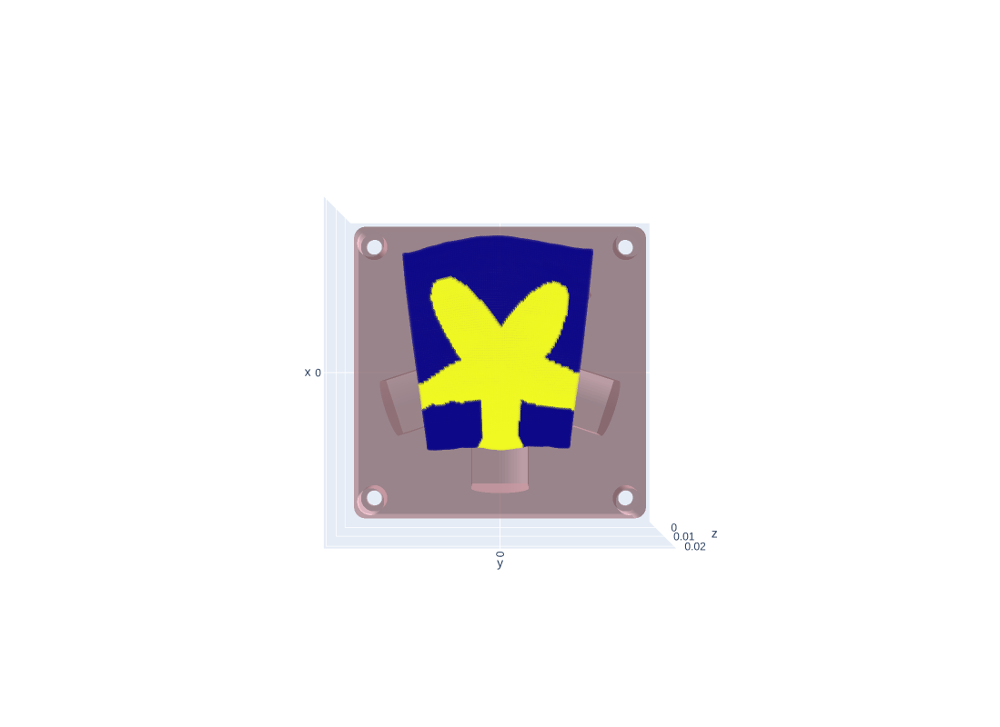

In [9]:
import plotly.graph_objects as go
from bubble_tools.bubble_shape_tools.shape_tools import get_bubble_tool_contact_points_sdf

# Visualization of the current observation
vertices = np.array(tool_mesh.vertices) * 0.001 # [mm] -> [m]
faces = np.array(tool_mesh.triangles)
fig = go.Figure(data=[go.Mesh3d(x = vertices[:,0], 
                                y = vertices[:,1], 
                                z = vertices[:,2], 
                                i = faces[:,0],
                                j = faces[:,1],
                                k = faces[:,2],
                                color='pink', 
                                opacity=0.8, lighting=dict(ambient=0.5)
                               )])

fig.add_trace(
    go.Scatter3d(
        x=bubble_pc_stl.reshape(-1, 3)[:,0],
        y=bubble_pc_stl.reshape(-1, 3)[:,1],
        z=bubble_pc_stl.reshape(-1, 3)[:,2],
        mode="markers", 
        marker=dict(size=3, color=data_i['bubble_pc_bcf'][SEQ_IDX][..., 3:].reshape(-1, 3), opacity=0.6),
    )
)
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=0, y=0, z=3)
)

fig.update_layout(scene_camera=camera)
fig.update_layout(width=800, height=800)
fig.show()

# Visualization of the ground truth contact mask

# Visualization of the current observation
vertices = np.array(tool_mesh.vertices) * 0.001 # [mm] -> [m]
faces = np.array(tool_mesh.triangles)
fig = go.Figure(data=[go.Mesh3d(x = vertices[:,0], 
                                y = vertices[:,1], 
                                z = vertices[:,2], 
                                i = faces[:,0],
                                j = faces[:,1],
                                k = faces[:,2],
                                color='pink', 
                                opacity=0.5, lighting=dict(ambient=0.5)
                               )])

contact_mask_r = get_bubble_tool_contact_points_sdf(data_i['bubble_pc_bcf'][SEQ_IDX][...,:3], 
                                                        data_i['shape_id'][SEQ_IDX], 
                                                        data_i['w_X_bcf'][SEQ_IDX], 
                                                        data_i['w_X_sf'][SEQ_IDX], 
                                                        contact_threshold=0.001)




fig.add_trace(
    go.Scatter3d(
        x=bubble_pc_stl.reshape(-1, 3)[:,0],
        y=bubble_pc_stl.reshape(-1, 3)[:,1],
        z=bubble_pc_stl.reshape(-1, 3)[:,2],
        mode="markers", 
        marker=dict(size=3, color=contact_mask_r.reshape(-1)*255., opacity=0.6),
    )
)

fig.update_layout(scene_camera=camera)
fig.update_layout(width=800, height=800)
fig.show()

In [10]:
# Non-dimensionalization
E = E / (L **2)   # rubber 0.1 GPa (N/m**2)
P = P / (L **2)
t = t * L# 0.3 mm
# geom = dde.geometry.Interval(-1, 1)
a, b = a*L, b*L
wall_coords = wall_coords * L
test_coords = test_points_subset * L
obs_pcd = obs_pcd * L
deformation_3d = deformation_3d * L

In [11]:
# Restore Model
from jaxpi.utils import restore_checkpoint

model = models.Membrane(
        config,
        wall_coords,
        obs_pcd,
        test_points_subset,
        E, P, t, nu, a, b, L, L_f,
    )
ckpt_path = os.path.join(".", "ckpt", config.wandb.name)
model.state = restore_checkpoint(model.state, ckpt_path)
params = model.state.params



Restore checkpoint  ./ckpt/smooth_no_zero_force_star_boundary


In [12]:
u_pred = model.u_pred_fn(params, deformation_3d[:,3], deformation_3d[:,4])
v_pred = model.v_pred_fn(params, deformation_3d[:,3], deformation_3d[:,4])
w_pred = model.w_pred_fn(params, deformation_3d[:,3], deformation_3d[:,4])
f_pred = model.f_pred_fn(params, deformation_3d[:,3], deformation_3d[:,4])
f_pred =abs(f_pred)

x_hat = deformation_3d[:, 3]/L + u_pred/L
y_hat = deformation_3d[:, 4]/L + v_pred/L
z_hat = w_pred/L
f_pred = f_pred * L ** 2 

pcd = np.concatenate([x_hat[..., np.newaxis],
                      y_hat[..., np.newaxis],
                      z_hat[..., np.newaxis]], axis = 1)

import matplotlib.cm as cm
color = cm.viridis(f_pred/max(f_pred))[..., :3]


In [13]:
# Ground truth wrench
wrench_w = np.array(data_i['wrench_w'][SEQ_IDX]) # (N, 6)

s = x_hat[2] - x_hat[1] # pointcloud should be ordered
cnt_fc = np.sum(abs(f_pred) * s**2)


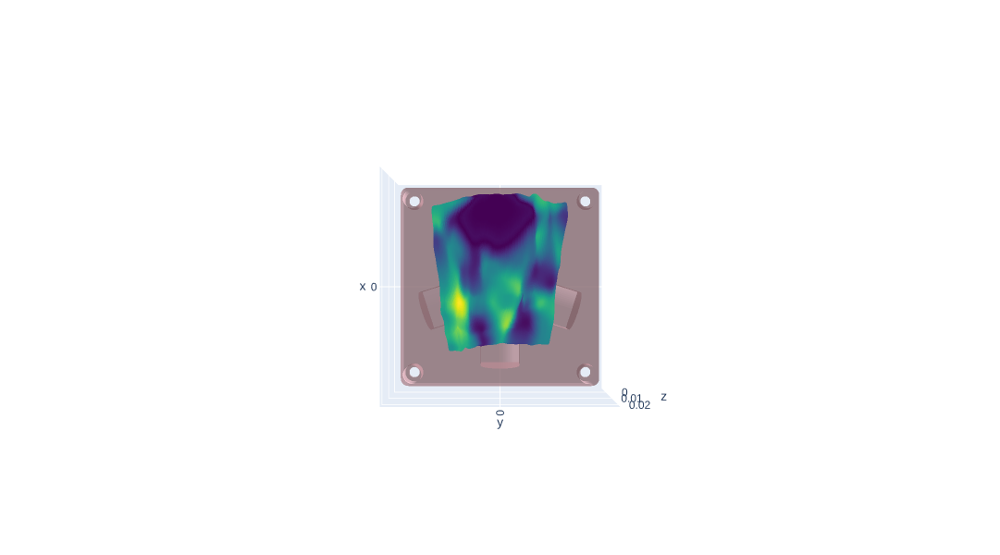

In [14]:
import plotly.graph_objects as go

# Download data set from plotly repo
vertices = np.array(tool_mesh.vertices) * 0.001 # [mm] -> [m]
faces = np.array(tool_mesh.triangles)
fig = go.Figure(data=[go.Mesh3d(x = vertices[:,0], 
                                y = vertices[:,1], 
                                z = vertices[:,2], 
                                i = faces[:,0],
                                j = faces[:,1],
                                k = faces[:,2],
                                color='pink', 
                                opacity=0.5, lighting=dict(ambient=0.5)
                               )])


from bubble_tools.bubble_tools.bubble_constants import get_bubble_frame_from_camera_frame
cf_T_bft = get_bubble_frame_from_camera_frame()
pcd_tf = tr_pointcloud(pcd.reshape((100,100,3)), T= stl_X_bcf@ cf_T_bft).reshape(-1,3)  # (H, W, 3 or 6)

# pcd = tr_pointcloud(pcd.reshape((100,100,3)), T=w_X_bcf @ cf_T_bft).reshape(-1,3)  # (H, W, 3 or 6)
fig.add_trace(
    go.Scatter3d(
        x=pcd_tf[:,0],
        y=pcd_tf[:,1],
        z=pcd_tf[:,2],
        mode="markers", 
        marker=dict(size=3, color=color, opacity=0.9),
    )
)
fig.update_layout(width=600, height=600)
fig.update_layout(scene_camera=camera)
fig.show()

In [15]:
title= f"wrench GT-{wrench_w}, EST-{cnt_fc}[N]"